In [1]:
%matplotlib widget
from collections import namedtuple
from enum import Enum
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import f1_score, silhouette_score
from sklearn.mixture import GaussianMixture

In [2]:
Syllable = namedtuple('Syllable', ['duration', 'label', 'pitchtrack', 'is_cv'])
Pitch = namedtuple('Pitch', ['time', 'f0']) # time measured in seconds, f0 measured in log10 of Hz
PitchTrack = namedtuple('PitchTrack', ['a0', 'a1', 'a2', 'num_pts'])
ReadMode = Enum('ReadMode', ['DURATION', 'PITCH'])

def pitch_track_reduce_dim(pitch_series):
    ts = np.array([p.time for p in pitch_series])
    ts_scaled = (2 * ts / (ts[-1] - ts[0]))
    ts_normalized = ts_scaled - (ts_scaled[0] - (-1))
    pitches = np.array([p.f0 for p in pitch_series])
    coefs = np.polynomial.legendre.legfit(ts_normalized, pitches, 2)
    a0, a1, a2 = coefs
    return PitchTrack(a0=a0, a1=a1, a2=a2, num_pts=len(ts))

def extract_syllables(fname):
    syllables = []
    read_mode = ReadMode.DURATION
    curr_is_cv = None
    curr_dur = None
    curr_label = None
    curr_pitches = []
    with open(fname, 'r') as f:
        for line in f:
            line = line.strip()
            if line.startswith('#'):
                continue
            if read_mode == ReadMode.DURATION:
                if line.startswith('Time_s'):
                    read_mode = ReadMode.PITCH
                    continue
                curr_dur, curr_label = line.split()
                curr_dur = float(curr_dur)
                if curr_label == 'NONE':
                    curr_label = None
                else:
                    curr_is_cv = (curr_label[1] == 'Y')
                    curr_label = curr_label[0]
            else:
                if line.startswith('END PITCH'):
                    if len(curr_pitches) > 1:
                        syllables.append(Syllable(duration=curr_dur,
                                                  label=curr_label,
                                                  pitchtrack=pitch_track_reduce_dim(curr_pitches),
                                                  is_cv=curr_is_cv))
                    curr_dur = None
                    curr_is_cv = None
                    curr_pitches = []
                    read_mode = ReadMode.DURATION
                    continue
                t, f0 = line.split()
                if f0 == '--undefined--':
                    continue
                curr_pitches.append(Pitch(time=float(t), f0=np.log10(float(f0))))
    return syllables

In [3]:
def z_score(syllables):
    syllables_a0_dist = [s.pitchtrack.a0 for s in syllables]
    syllables_a1_dist = [s.pitchtrack.a1 for s in syllables]
    syllables_a2_dist = [s.pitchtrack.a2 for s in syllables]
    return [Syllable(s.duration, s.label, PitchTrack(
        (s.pitchtrack.a0 - np.mean(syllables_a0_dist)) / np.std(syllables_a0_dist),
        (s.pitchtrack.a1 - np.mean(syllables_a1_dist)) / np.std(syllables_a1_dist),
        (s.pitchtrack.a2 - np.mean(syllables_a2_dist)) / np.std(syllables_a2_dist),
        s.pitchtrack.num_pts,
    ), s.is_cv) for s in syllables]

syllables_mandarin = (extract_syllables('data/praatoutput/BEJ01B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ01D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ02B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ02D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ03D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ04B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ04D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ05B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ05D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ06B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ06D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ07B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ07D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ08B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ08D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ09B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ09D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ10B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ10D_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ11B_pitch.txt')
                      + extract_syllables('data/praatoutput/BEJ11D_pitch.txt'))
syllables_mandarin = [s for s in syllables_mandarin if s.pitchtrack.num_pts >= 5 and s.label]# and s.duration > 0.1]
syllables_mandarin_zscore = z_score(syllables_mandarin)
print(len(syllables_mandarin))


syllables_english = (extract_syllables('data/praatoutput/USD01B_pitch.txt')
                     + extract_syllables('data/praatoutput/USD01D_pitch.txt')
                     + extract_syllables('data/praatoutput/USD02B_pitch.txt')
                     + extract_syllables('data/praatoutput/USD02D_pitch.txt')
                     + extract_syllables('data/praatoutput/USD03B_pitch.txt')
                     + extract_syllables('data/praatoutput/USD03D_pitch.txt')
                     + extract_syllables('data/praatoutput/USD04B_pitch.txt')
                     + extract_syllables('data/praatoutput/USD04D_pitch.txt')
                     + extract_syllables('data/praatoutput/USD05B_pitch.txt')
                     + extract_syllables('data/praatoutput/USD05D_pitch.txt'))
syllables_english = [s for s in syllables_english if s.pitchtrack.num_pts >= 5]# and s.duration > 0.2]
syllables_english_zscore = z_score(syllables_english)
print(len(syllables_english))


syllables_hadza = (extract_syllables('data/praatoutput/HAD01B_pitch.txt')
                   + extract_syllables('data/praatoutput/HAD01D_pitch.txt')
                   + extract_syllables('data/praatoutput/HAD02B_pitch.txt')
                   + extract_syllables('data/praatoutput/HAD02D_pitch.txt')
                   + extract_syllables('data/praatoutput/HAD03B_pitch.txt')
                   + extract_syllables('data/praatoutput/HAD03D_pitch.txt'))
syllables_hadza = [s for s in syllables_hadza if s.pitchtrack.num_pts >= 5]# and s.duration > 0.2]
syllables_hadza_zscore = z_score(syllables_hadza)
print(len(syllables_hadza))

/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full

839


/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full

558


/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full

583


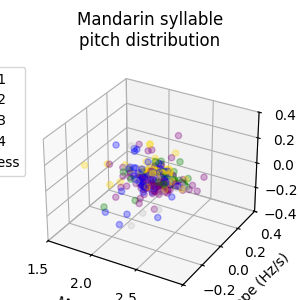

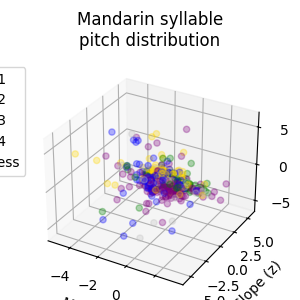

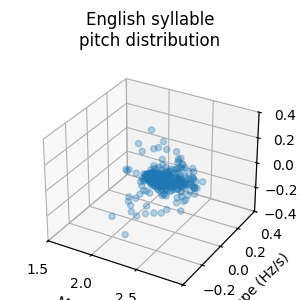

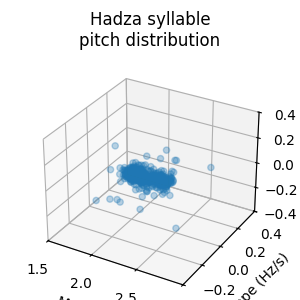

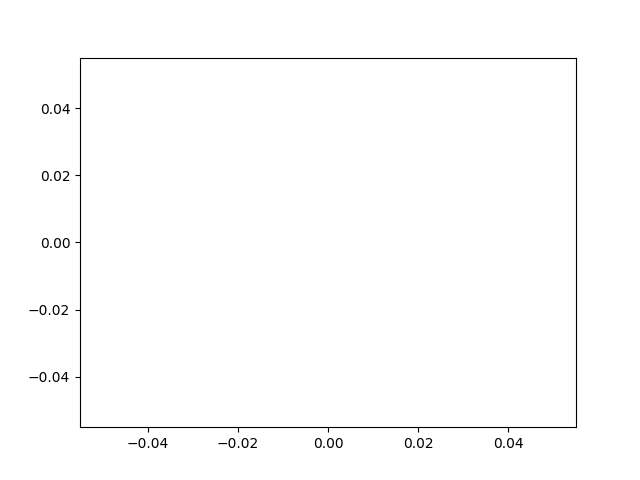

In [4]:
tone_colors = {
    None: 'red',
    '1': 'green',
    '2': 'gold',
    '3': 'blue',
    '4': 'purple',
    '5': 'silver'
}
tone_labels = {
    #None: 'Unlabeled',
    '1': 'Tone 1',
    '2': 'Tone 2',
    '3': 'Tone 3',
    '4': 'Tone 4',
    '5': 'Toneless'
}
tone_indices = {
    None: 0,
    '1': 1,
    '2': 2,
    '3': 3,
    '4': 4,
    '5': 5
}
lp = lambda i: plt.plot([],[],color=tone_colors[i], mec="none", label=tone_labels[i], ls="", marker="o")[0]
handles = [lp(i) for i in tone_labels]

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin],
           [s.pitchtrack.a1 for s in syllables_mandarin],
           [s.pitchtrack.a2 for s in syllables_mandarin],
           c=[tone_colors[s.label] for s in syllables_mandarin],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_zscore],
           [s.pitchtrack.a1 for s in syllables_mandarin_zscore],
           [s.pitchtrack.a2 for s in syllables_mandarin_zscore],
           c=[tone_colors[s.label] for s in syllables_mandarin_zscore],
           alpha=0.3)
ax.set_xlabel('Mean (z)')
ax.set_ylabel('Slope (z)')
ax.set_zlabel('Curve (z)')
ax.set_title('Mandarin syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_english],
           [s.pitchtrack.a1 for s in syllables_english],
           [s.pitchtrack.a2 for s in syllables_english],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('English syllable\npitch distribution', pad=10)
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_hadza],
           [s.pitchtrack.a1 for s in syllables_hadza],
           [s.pitchtrack.a2 for s in syllables_hadza],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Hadza syllable\npitch distribution', pad=10)
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

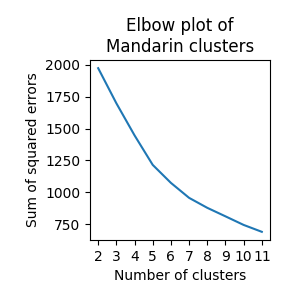

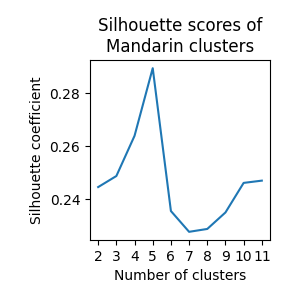

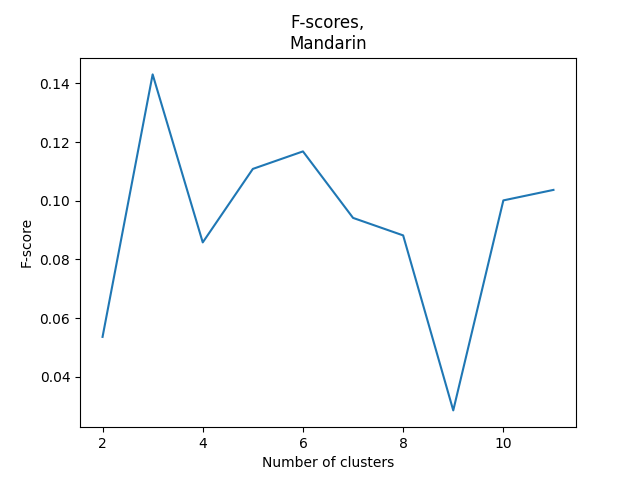

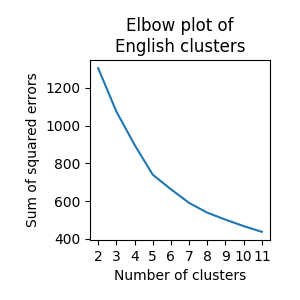

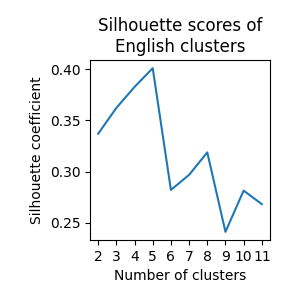

...

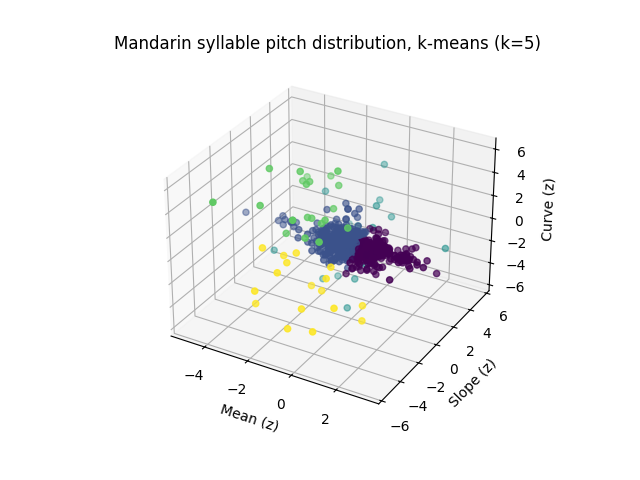

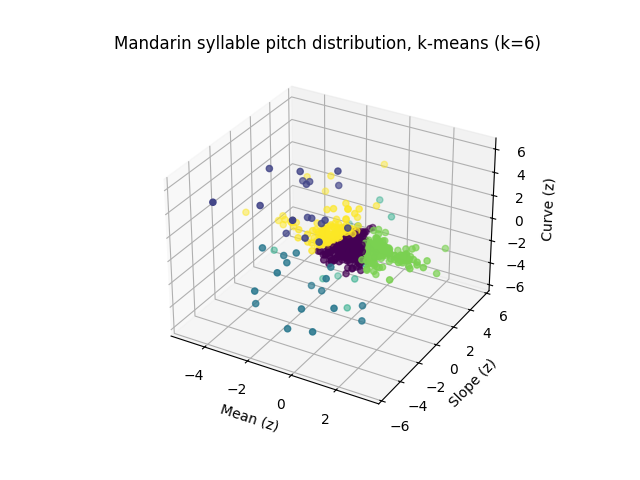

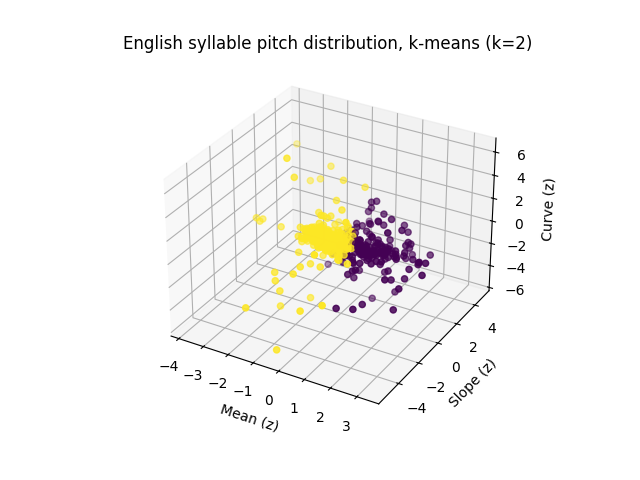

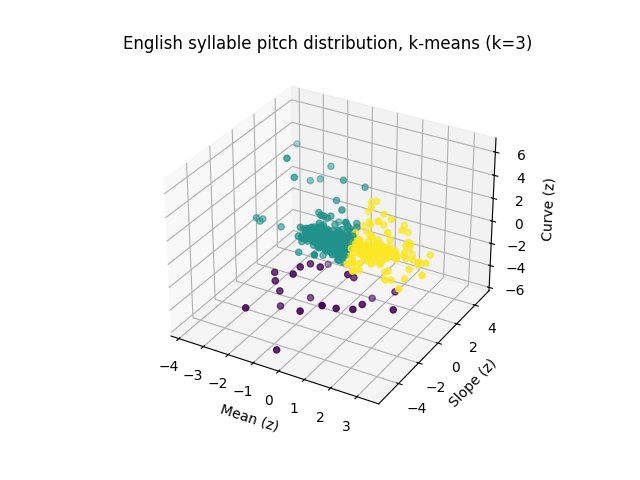

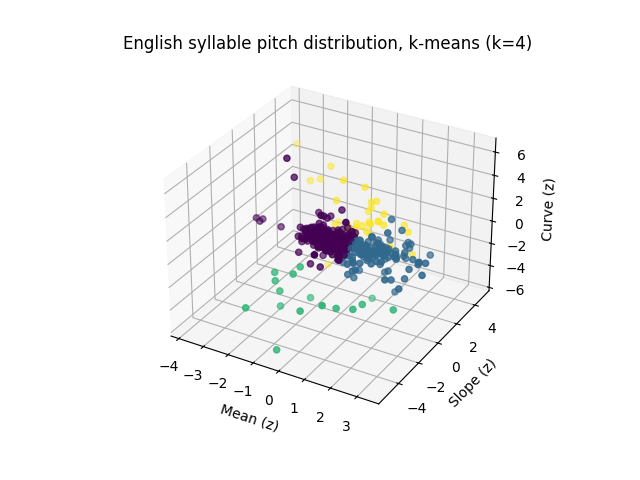

/tmp/ipykernel_50838/3096845828.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


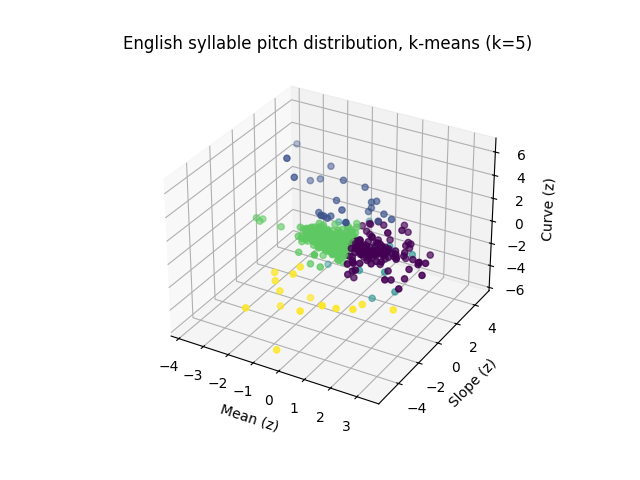

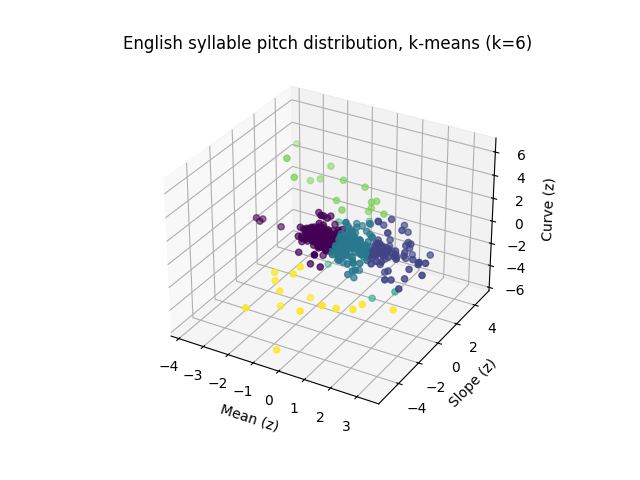

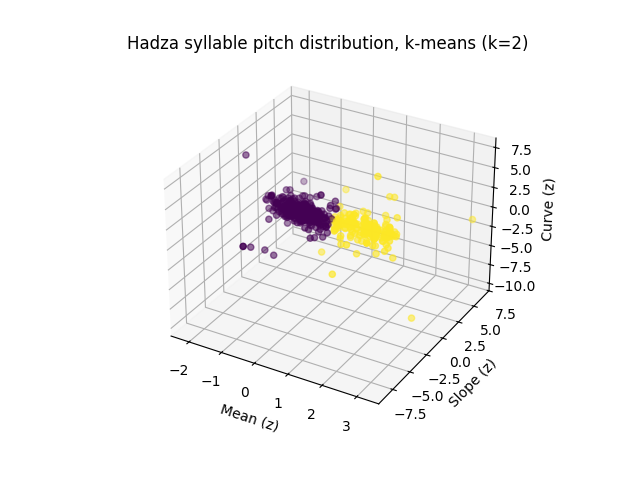

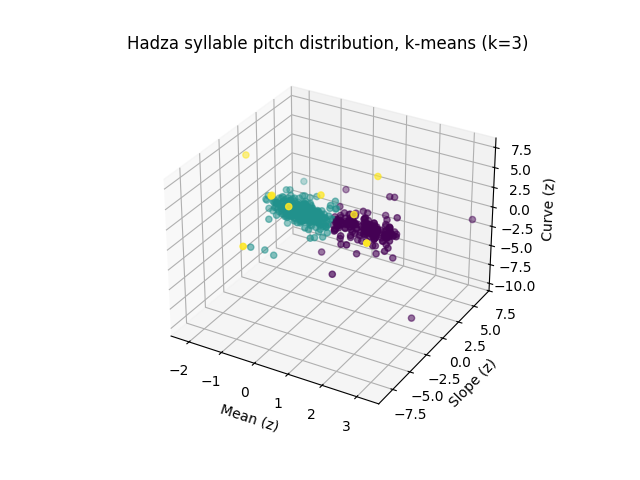

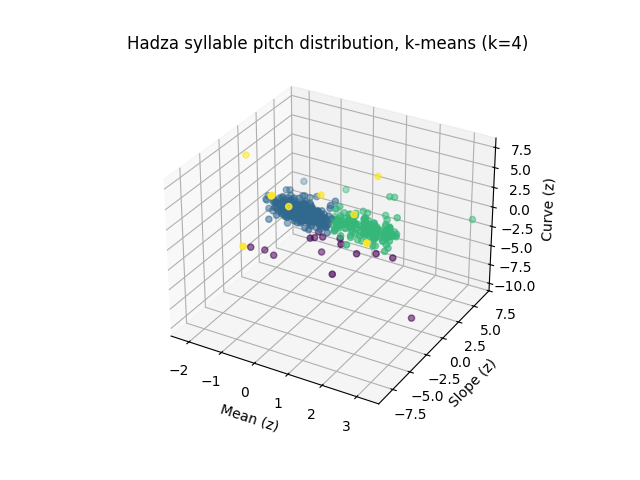

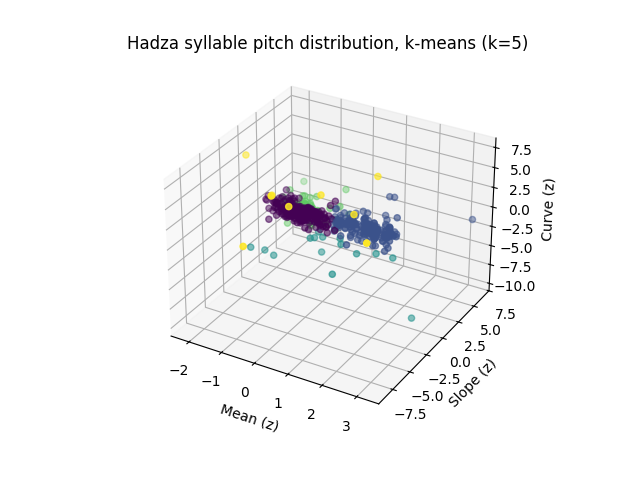

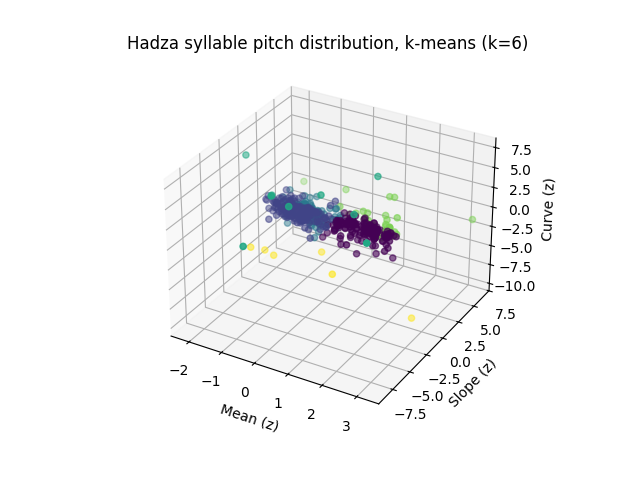

In [5]:
def make_kmeans_plots(syllables, language, accuracy=False):
    num_ks = 10
    k_vals = np.arange(2,2+num_ks)
    sse_vals = np.zeros(num_ks)
    sil_vals = np.zeros(num_ks)
    if accuracy:
        accuracy_vals = np.zeros(num_ks)
    kmeanss = []
    dataset = [(s.pitchtrack.a0, s.pitchtrack.a1, s.pitchtrack.a2) for s in syllables]
    for i, k in enumerate(k_vals):
        kmeans = KMeans(n_clusters=k, max_iter=1000, n_init=50).fit(dataset)
        sse_vals[i] = kmeans.inertia_
        sil_vals[i] = silhouette_score(dataset, kmeans.labels_)
        if accuracy:
            accuracy_vals[i] = f1_score([tone_indices[s.label] for s in syllables], kmeans.labels_, average='micro')
        kmeanss.append(kmeans)
    
    plt.figure(figsize=(3,3))
    plt.tight_layout()
    plt.plot(k_vals, sse_vals)
    plt.xlabel('Number of clusters')
    plt.ylabel('Sum of squared errors')
    plt.title(f'Elbow plot of\n{language} clusters')
    plt.subplots_adjust(left=0.3, bottom=0.2, right=0.9, top=0.8)
    plt.xticks(k_vals)
    plt.show()
    
    plt.figure(figsize=(3,3))
    plt.tight_layout()
    plt.plot(k_vals, sil_vals)
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette coefficient')
    plt.title(f'Silhouette scores of\n{language} clusters')
    plt.subplots_adjust(left=0.3, bottom=0.2, right=0.9, top=0.8)
    plt.xticks(k_vals)
    plt.show()

    if accuracy:
        plt.figure()
        plt.plot(k_vals, accuracy_vals)
        plt.xlabel('Number of clusters')
        plt.ylabel('F-score')
        plt.title(f'F-scores,\n{language}')
        plt.show()

    return kmeanss, [kmeans.labels_ for kmeans in kmeanss]

def show_kmeans_predictions(syllables, k, kmeans_labels, language):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter([s.pitchtrack.a0 for s in syllables],
               [s.pitchtrack.a1 for s in syllables],
               [s.pitchtrack.a2 for s in syllables],
               c=kmeans_labels[k-2])
    ax.set_xlabel('Mean (z)')
    ax.set_ylabel('Slope (z)')
    ax.set_zlabel('Curve (z)')
    ax.set_title(f'{language} syllable pitch distribution, k-means (k={k})')
    plt.show()

mandarin_kmeanss, mandarin_kmeans_labels = make_kmeans_plots(syllables_mandarin_zscore, 'Mandarin', accuracy=True)
english_kmeanss, english_kmeans_labels = make_kmeans_plots(syllables_english_zscore, 'English')
hadza_kmeanss, hadza_kmeans_labels = make_kmeans_plots(syllables_hadza_zscore, 'Hadza')
for i in range(2,7):
    show_kmeans_predictions(syllables_mandarin_zscore, i, mandarin_kmeans_labels, 'Mandarin')
for i in range(2,7):
    show_kmeans_predictions(syllables_english_zscore, i, english_kmeans_labels, 'English')
for i in range(2,7):
    show_kmeans_predictions(syllables_hadza_zscore, i, hadza_kmeans_labels, 'Hadza')

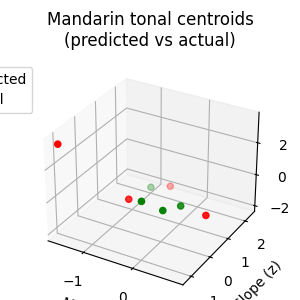

In [6]:
# Compare Mandarin centroids predicted vs actual
mandarin_centroids_predicted = mandarin_kmeanss[2].cluster_centers_
mandarin_centroids_actual = np.array([
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_zscore if s.label == '1']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_zscore if s.label == '1']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_zscore if s.label == '1'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_zscore if s.label == '2']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_zscore if s.label == '2']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_zscore if s.label == '2'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_zscore if s.label == '3']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_zscore if s.label == '3']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_zscore if s.label == '3'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_zscore if s.label == '4']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_zscore if s.label == '4']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_zscore if s.label == '4'])
    ]
])

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter(mandarin_centroids_predicted[:,0],
           mandarin_centroids_predicted[:,1],
           mandarin_centroids_predicted[:,2],
           c='red')
ax.scatter(mandarin_centroids_actual[:,0],
           mandarin_centroids_actual[:,1],
           mandarin_centroids_actual[:,2],
           c='green')
ax.set_xlabel('Mean (z)')
ax.set_ylabel('Slope (z)')
ax.set_zlabel('Curve (z)')
ax.set_title('Mandarin tonal centroids\n(predicted vs actual)', pad=10)
lp2 = lambda l, c: plt.plot([],[],color=c, mec="none", label=l, ls="", marker="o")[0]
handles = [lp2('Predicted', 'red'), lp2('Actual', 'green')]
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

In [7]:
#Compare Mandarin IDS vs ADS
syllables_mandarin_ids = (extract_syllables('data/praatoutput/BEJ01B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ02B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ04B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ05B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ06B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ07B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ08B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ09B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ10B_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ11B_pitch.txt'))
syllables_mandarin_ids = [s for s in syllables_mandarin_ids if s.pitchtrack.num_pts >= 5 and s.label]
syllables_mandarin_ids_zscore = z_score(syllables_mandarin_ids)
print(len(syllables_mandarin_ids))

syllables_mandarin_ads = (extract_syllables('data/praatoutput/BEJ01D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ02D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ03D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ04D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ05D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ06D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ07D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ08D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ09D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ10D_pitch.txt')
                          + extract_syllables('data/praatoutput/BEJ11D_pitch.txt'))
syllables_mandarin_ads = [s for s in syllables_mandarin_ads if s.pitchtrack.num_pts >= 5 and s.label]
syllables_mandarin_ads_zscore = z_score(syllables_mandarin_ads)
print(len(syllables_mandarin_ads))

/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full

320


/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)


519


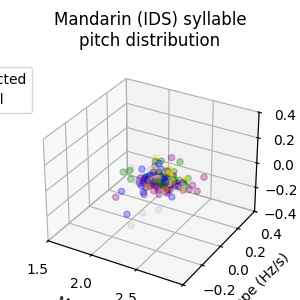

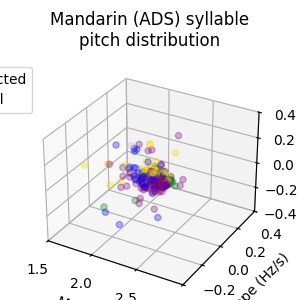

In [8]:
fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_ids],
           [s.pitchtrack.a1 for s in syllables_mandarin_ids],
           [s.pitchtrack.a2 for s in syllables_mandarin_ids],
           c=[tone_colors[s.label] for s in syllables_mandarin_ids],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin (IDS) syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_ads],
           [s.pitchtrack.a1 for s in syllables_mandarin_ads],
           [s.pitchtrack.a2 for s in syllables_mandarin_ads],
           c=[tone_colors[s.label] for s in syllables_mandarin_ads],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin (ADS) syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

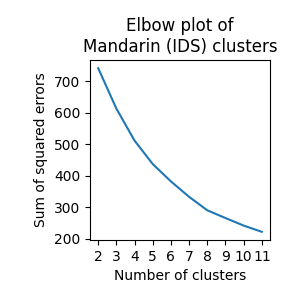

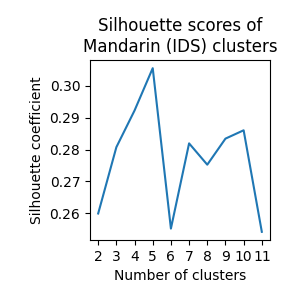

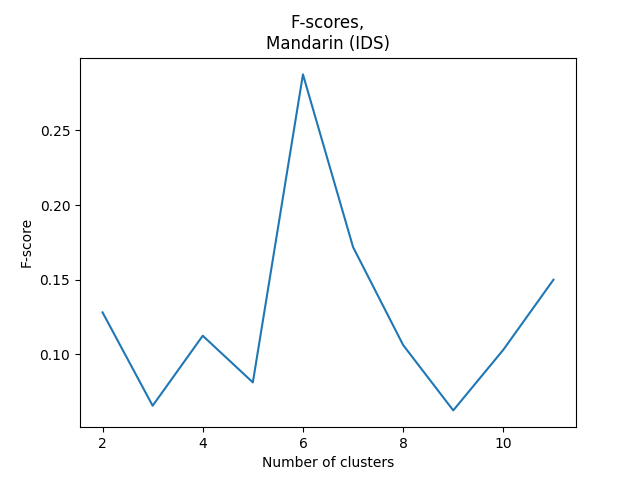

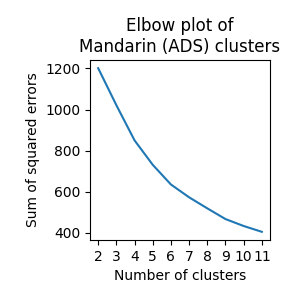

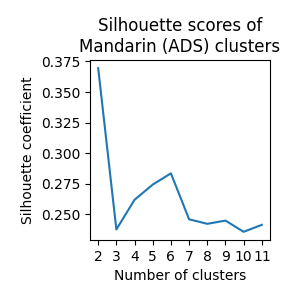

...

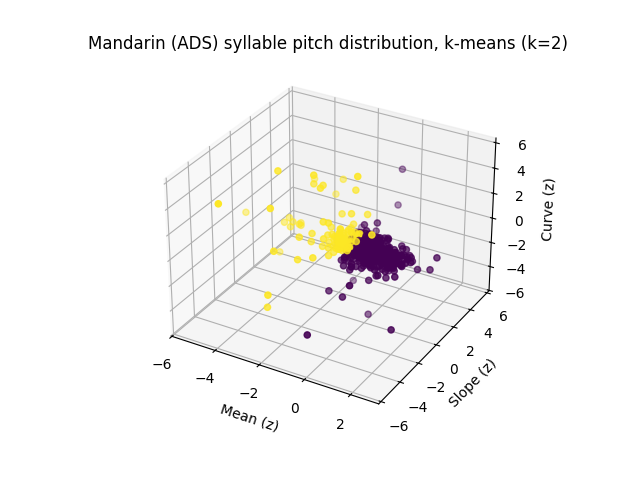

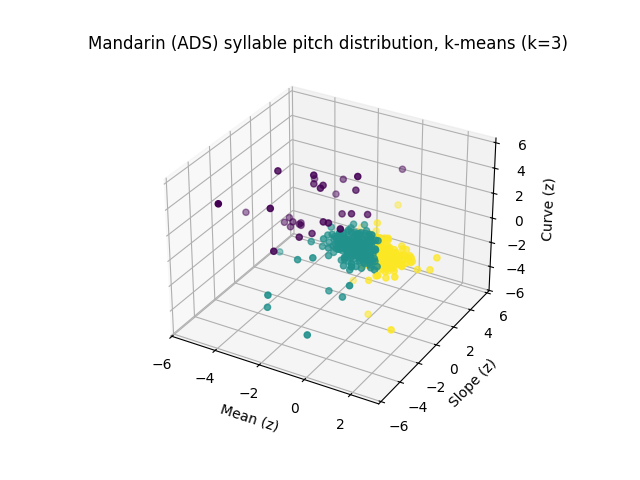

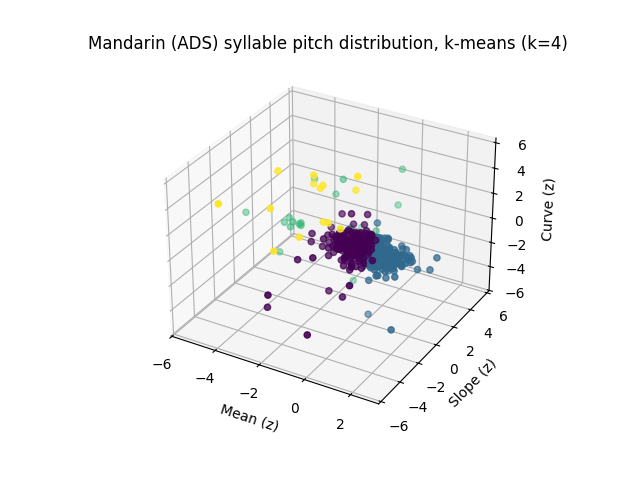

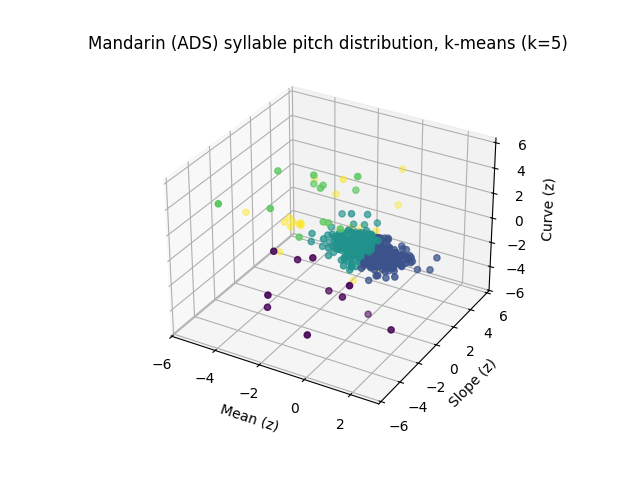

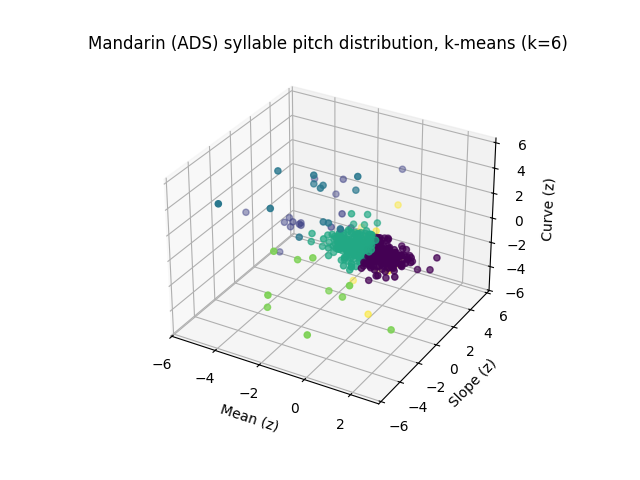

In [9]:
_, mandarin_ids_kmeans_labels = make_kmeans_plots(syllables_mandarin_ids_zscore, 'Mandarin (IDS)', accuracy=True)
_, mandarin_ads_kmeans_labels = make_kmeans_plots(syllables_mandarin_ads_zscore, 'Mandarin (ADS)', accuracy=True)

for i in range(2,7):
    show_kmeans_predictions(syllables_mandarin_ids_zscore, i, mandarin_ids_kmeans_labels, 'Mandarin (IDS)')
for i in range(2,7):
    show_kmeans_predictions(syllables_mandarin_ads_zscore, i, mandarin_ads_kmeans_labels, 'Mandarin (ADS)')

In [10]:
#Compare Mandarin short- vs long-duration tokens
syllables_mandarin_short = [s for s in syllables_mandarin if s.duration <= 0.1125] # ~10th percentile
syllables_mandarin_short_zscore = z_score(syllables_mandarin_short)
print(len(syllables_mandarin_short))

syllables_mandarin_long = [s for s in syllables_mandarin if s.duration >= 0.4341] # ~90th percentile
syllables_mandarin_long_zscore = z_score(syllables_mandarin_long)
print(len(syllables_mandarin_long))

83
84


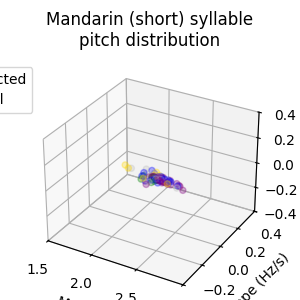

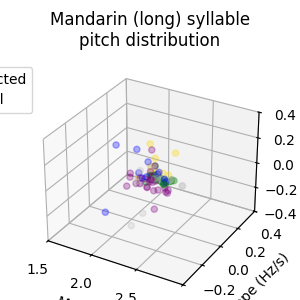

In [11]:
fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_short],
           [s.pitchtrack.a1 for s in syllables_mandarin_short],
           [s.pitchtrack.a2 for s in syllables_mandarin_short],
           c=[tone_colors[s.label] for s in syllables_mandarin_short],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin (short) syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_long],
           [s.pitchtrack.a1 for s in syllables_mandarin_long],
           [s.pitchtrack.a2 for s in syllables_mandarin_long],
           c=[tone_colors[s.label] for s in syllables_mandarin_long],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin (long) syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

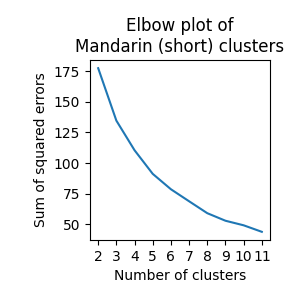

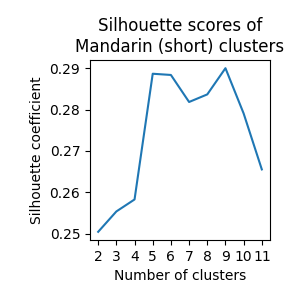

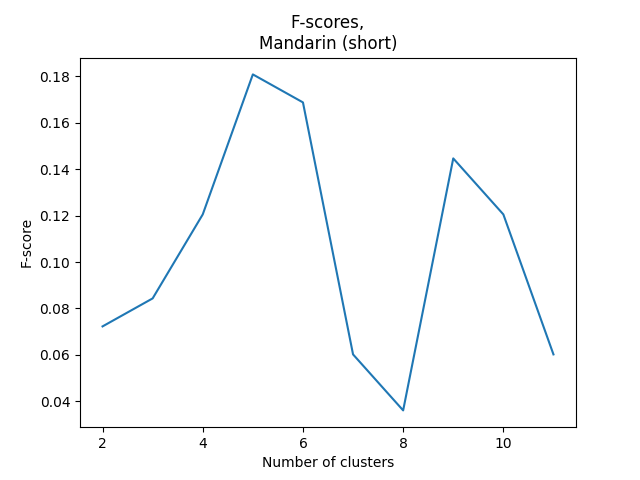

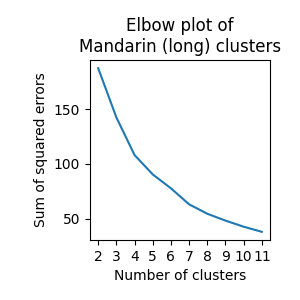

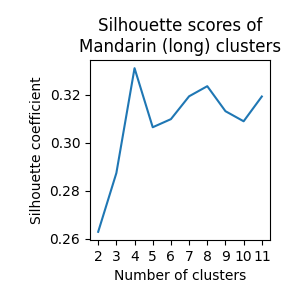

...

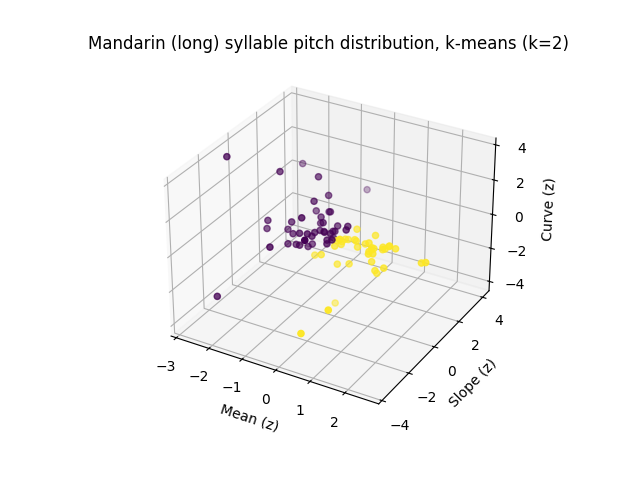

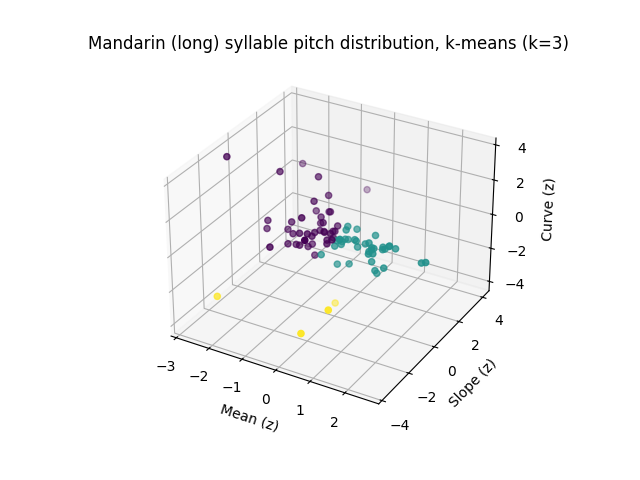

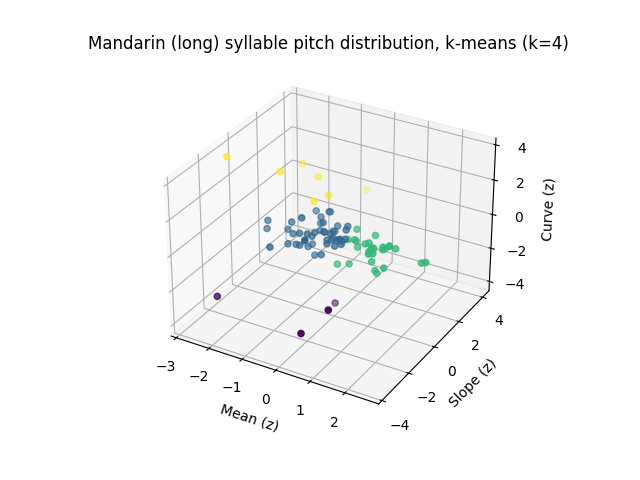

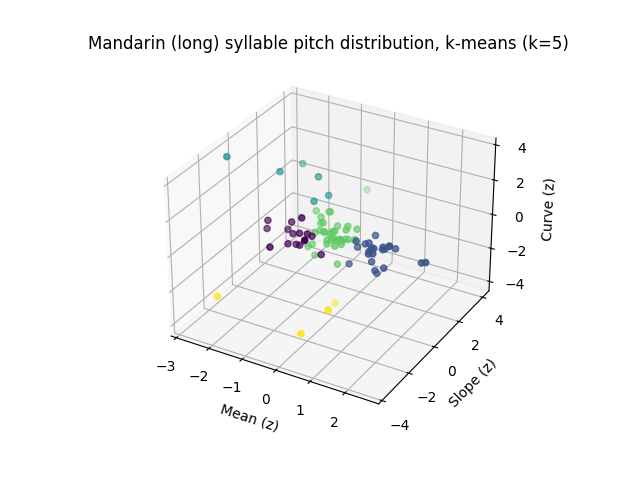

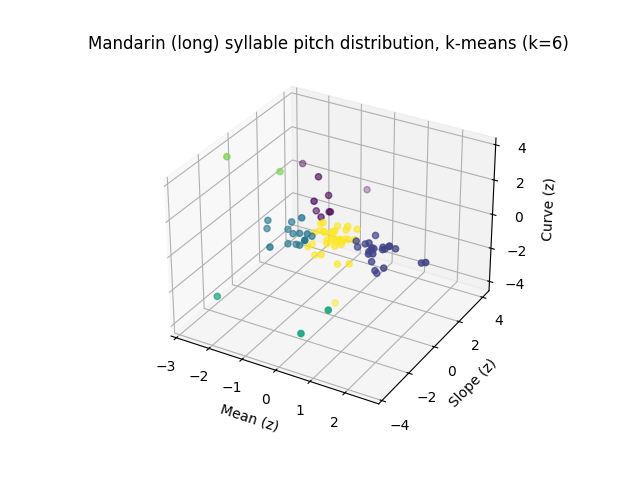

In [12]:
mandarin_short_kmeanss, mandarin_short_kmeans_labels = make_kmeans_plots(syllables_mandarin_short_zscore, 'Mandarin (short)', accuracy=True)
mandarin_long_kmeanss, mandarin_long_kmeans_labels = make_kmeans_plots(syllables_mandarin_long_zscore, 'Mandarin (long)', accuracy=True)

for i in range(2,7):
    show_kmeans_predictions(syllables_mandarin_short_zscore, i, mandarin_short_kmeans_labels, 'Mandarin (short)')
for i in range(2,7):
    show_kmeans_predictions(syllables_mandarin_long_zscore, i, mandarin_long_kmeans_labels, 'Mandarin (long)')

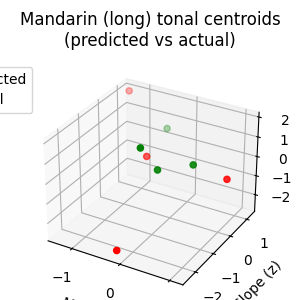

In [13]:
mandarin_long_centroids_predicted = mandarin_long_kmeanss[2].cluster_centers_
mandarin_long_centroids_actual = np.array([
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_long_zscore if s.label == '1']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_long_zscore if s.label == '1']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_long_zscore if s.label == '1'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_long_zscore if s.label == '2']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_long_zscore if s.label == '2']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_long_zscore if s.label == '2'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_long_zscore if s.label == '3']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_long_zscore if s.label == '3']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_long_zscore if s.label == '3'])
    ],
    [
        np.mean([s.pitchtrack.a0 for s in syllables_mandarin_long_zscore if s.label == '4']),
        np.mean([s.pitchtrack.a1 for s in syllables_mandarin_long_zscore if s.label == '4']),
        np.mean([s.pitchtrack.a2 for s in syllables_mandarin_long_zscore if s.label == '4'])
    ]
])

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter(mandarin_long_centroids_predicted[:,0],
           mandarin_long_centroids_predicted[:,1],
           mandarin_long_centroids_predicted[:,2],
           c='red')
ax.scatter(mandarin_long_centroids_actual[:,0],
           mandarin_long_centroids_actual[:,1],
           mandarin_long_centroids_actual[:,2],
           c='green')
ax.set_xlabel('Mean (z)')
ax.set_ylabel('Slope (z)')
ax.set_zlabel('Curve (z)')
ax.set_title('Mandarin (long) tonal centroids\n(predicted vs actual)', pad=10)
lp2 = lambda l, c: plt.plot([],[],color=c, mec="none", label=l, ls="", marker="o")[0]
handles = [lp2('Predicted', 'red'), lp2('Actual', 'green')]
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

In [14]:
syllables_mandarin_one_traj = extract_syllables('data/praatoutput/BEJ01D_pitch.txt')[6:16]
syllables_english_one_traj = extract_syllables('data/praatoutput/USD01D_pitch.txt')[2:17]

/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)
/home/etao/Desktop/tutorial-ling/lib64/python3.13/site-packages/numpy/polynomial/legendre.py:1370: RankWarning: The fit may be poorly conditioned
  return pu._fit(legvander, x, y, deg, rcond, full, w)


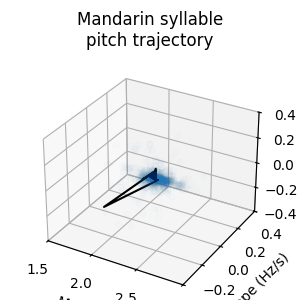

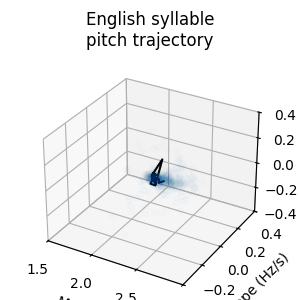

In [15]:
fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin],
           [s.pitchtrack.a1 for s in syllables_mandarin],
           [s.pitchtrack.a2 for s in syllables_mandarin],
           alpha=0.01)
ax.plot([s.pitchtrack.a0 for s in syllables_mandarin_one_traj],
        [s.pitchtrack.a1 for s in syllables_mandarin_one_traj],
        [s.pitchtrack.a2 for s in syllables_mandarin_one_traj],
        c='black')
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin syllable\npitch trajectory', pad=10)
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_english],
           [s.pitchtrack.a1 for s in syllables_english],
           [s.pitchtrack.a2 for s in syllables_english],
           alpha=0.01)
ax.plot([s.pitchtrack.a0 for s in syllables_english_one_traj],
        [s.pitchtrack.a1 for s in syllables_english_one_traj],
        [s.pitchtrack.a2 for s in syllables_english_one_traj],
        c='black')
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('English syllable\npitch trajectory', pad=10)
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

In [16]:
#Focus in on Mandarin CV syllables
syllables_mandarin_cv = [s for s in syllables_mandarin if s.is_cv]
syllables_mandarin_cv_zscore = z_score(syllables_mandarin_cv)
print(len(syllables_mandarin_cv))

582


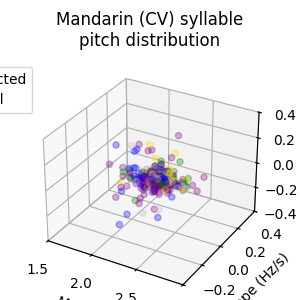

In [17]:
fig = plt.figure(figsize=(3,3))
plt.tight_layout()
ax = fig.add_subplot(projection='3d')
ax.scatter([s.pitchtrack.a0 for s in syllables_mandarin_cv],
           [s.pitchtrack.a1 for s in syllables_mandarin_cv],
           [s.pitchtrack.a2 for s in syllables_mandarin_cv],
           c=[tone_colors[s.label] for s in syllables_mandarin_cv],
           alpha=0.3)
ax.set_xlabel('Mean (Hz)')
ax.set_ylabel('Slope (Hz/s)')
ax.set_zlabel('Curve (Hz/s^2)')
ax.axes.set_xlim3d(left=1.5, right=3)
ax.axes.set_ylim3d(bottom=-0.4, top=0.4)
ax.axes.set_zlim3d(bottom=-0.4, top=0.4)
ax.set_title('Mandarin (CV) syllable\npitch distribution', pad=10)
plt.legend(handles=handles, loc='upper left', bbox_to_anchor=(-0.5, 1))
plt.subplots_adjust(left=0.1, bottom=0, right=0.9, top=0.8)
plt.show()

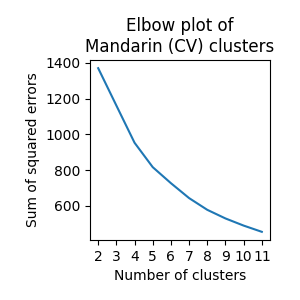

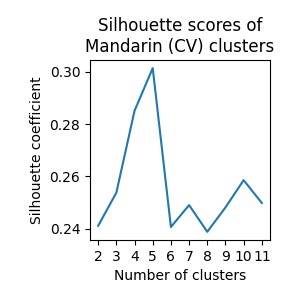

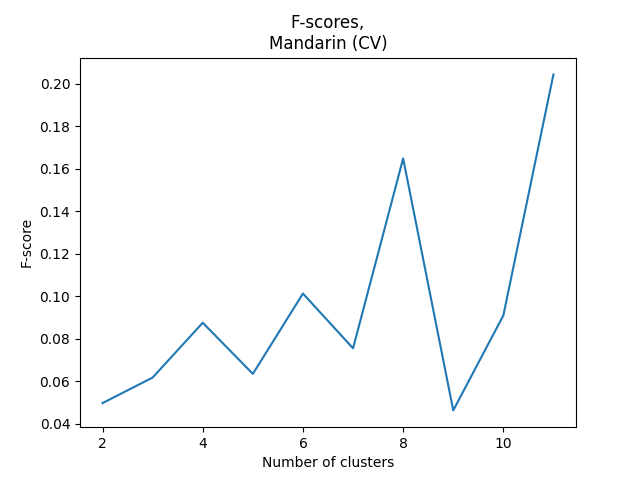

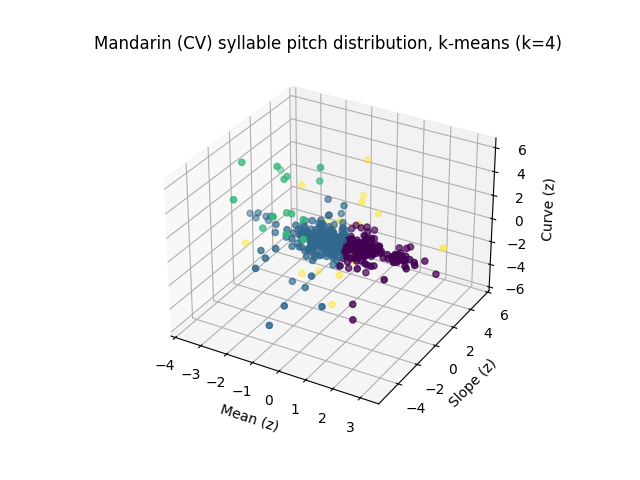

In [18]:
mandarin_cv_kmeanss, mandarin_cv_kmeans_labels = make_kmeans_plots(syllables_mandarin_cv_zscore, 'Mandarin (CV)', accuracy=True)
show_kmeans_predictions(syllables_mandarin_cv_zscore, 4, mandarin_cv_kmeans_labels, 'Mandarin (CV)')

Silhouette coefficient for Mandarin 0.3384866173133158
F-score for Mandarin 0.0
Silhouette coefficient for English 0.3338405067930615
Silhouette coefficient for Hadza 0.26729022745855774


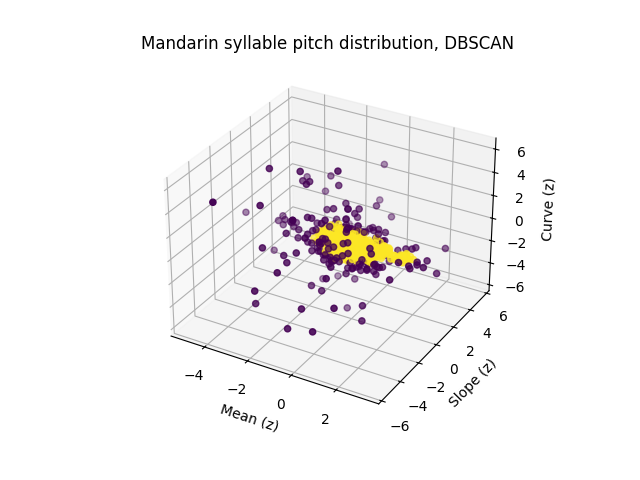

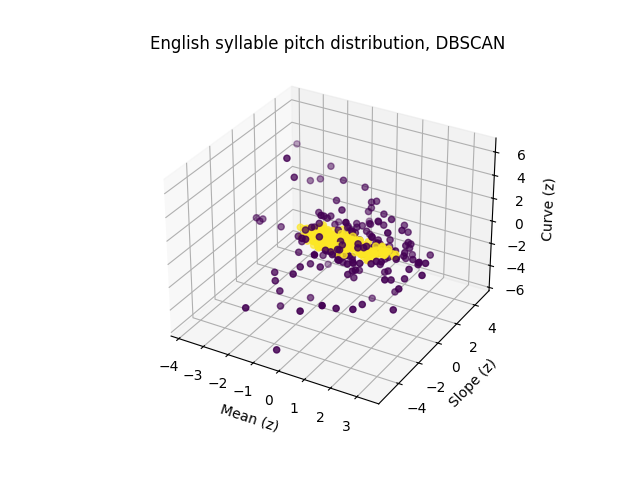

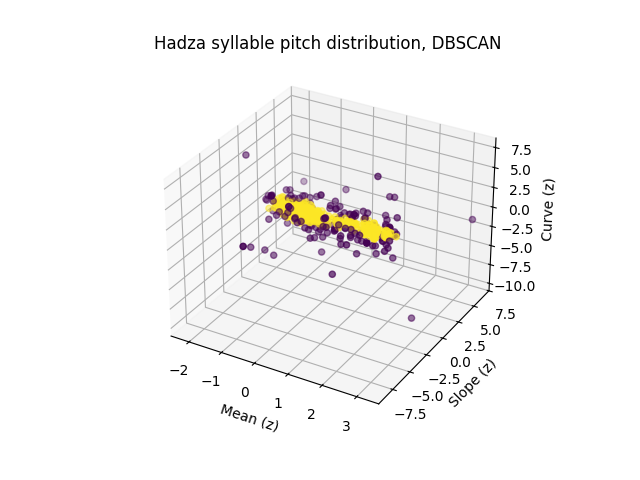

In [19]:
# Maybe algorithms other than k-means work better? Let's try a density-based algorithm (DBSCAN) and a distribution-based algorithm (a Gaussian mixture model)
def make_DBSCAN_plots(syllables, language, accuracy=False):
    dataset = [(s.pitchtrack.a0, s.pitchtrack.a1, s.pitchtrack.a2) for s in syllables]
    dbscan = DBSCAN(eps=0.4, min_samples=10).fit(dataset)
    print(f'Silhouette coefficient for {language}', silhouette_score(dataset, dbscan.labels_))
    if accuracy:
        print(f'F-score for {language}', f1_score([tone_indices[s.label] for s in syllables], dbscan.labels_, average='micro'))
    return dbscan, dbscan.labels_

def show_DBSCAN_predictions(syllables, dbscan_labels, language):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter([s.pitchtrack.a0 for s in syllables],
               [s.pitchtrack.a1 for s in syllables],
               [s.pitchtrack.a2 for s in syllables],
               c=dbscan_labels)
    ax.set_xlabel('Mean (z)')
    ax.set_ylabel('Slope (z)')
    ax.set_zlabel('Curve (z)')
    ax.set_title(f'{language} syllable pitch distribution, DBSCAN')
    plt.show()

mandarin_dbscan, mandarin_dbscan_labels = make_DBSCAN_plots(syllables_mandarin_zscore, 'Mandarin', accuracy=True)
english_dbscan, english_dbscan_labels = make_DBSCAN_plots(syllables_english_zscore, 'English')
hadza_dbscan, hadza_dbscan_labels = make_DBSCAN_plots(syllables_hadza_zscore, 'Hadza')
show_DBSCAN_predictions(syllables_mandarin_zscore, mandarin_dbscan_labels, 'Mandarin')
show_DBSCAN_predictions(syllables_english_zscore, english_dbscan_labels, 'English')
show_DBSCAN_predictions(syllables_hadza_zscore, hadza_dbscan_labels, 'Hadza')

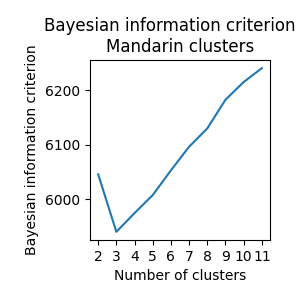

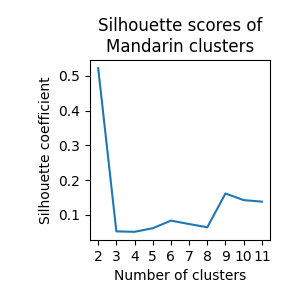

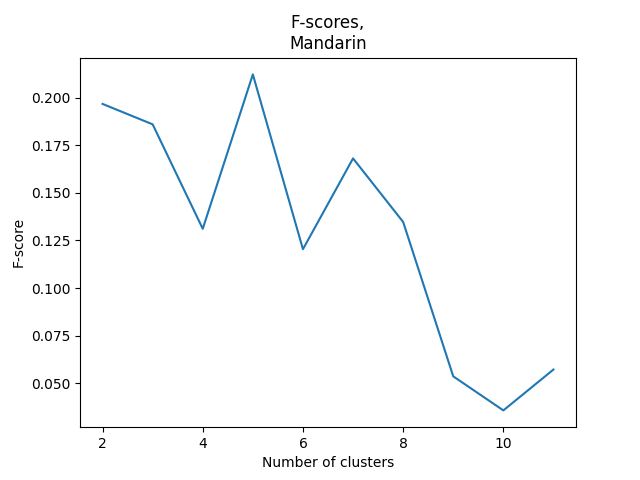

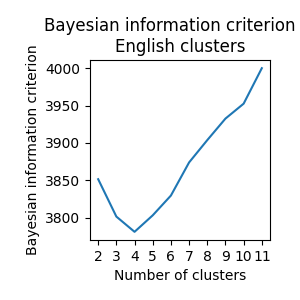

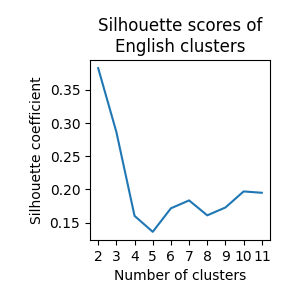

...

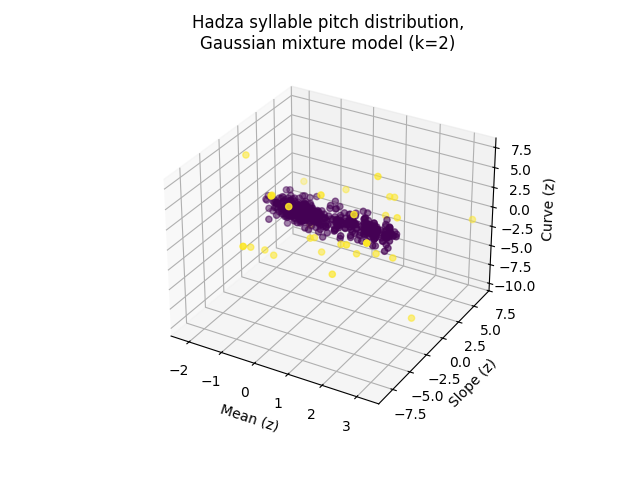

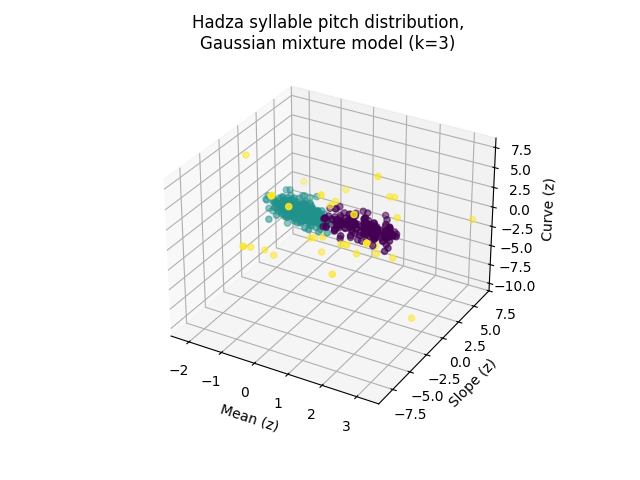

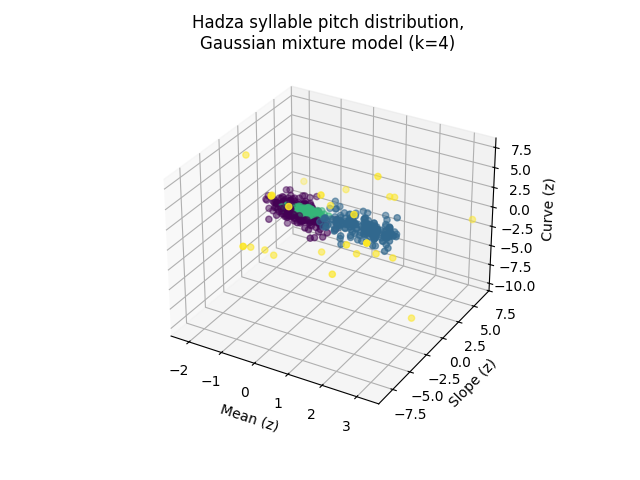

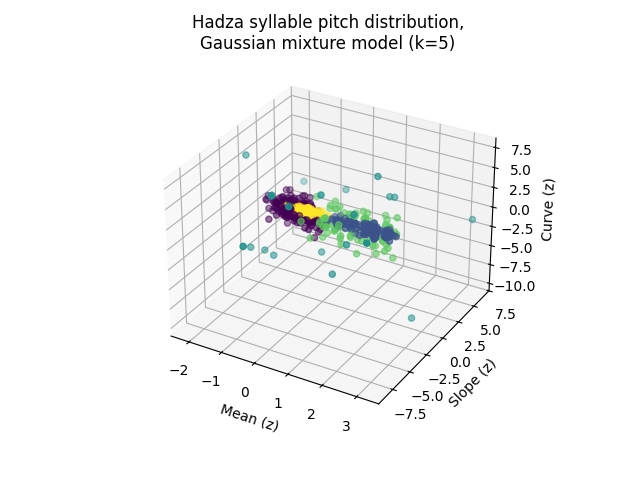

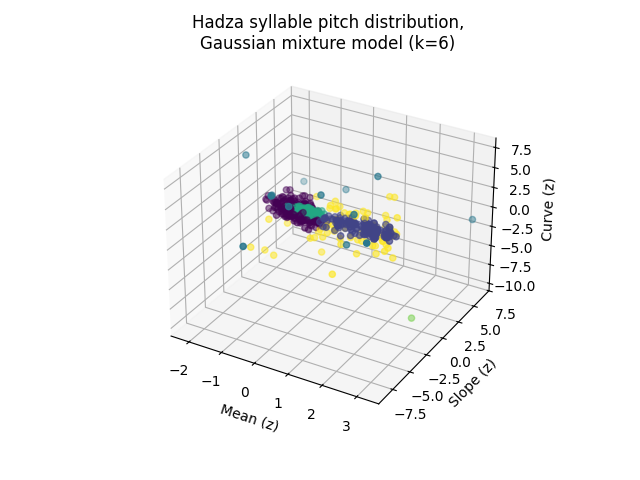

In [20]:
def make_GMM_plots(syllables, language, accuracy=False):
    num_ks = 10
    k_vals = np.arange(2,2+num_ks)
    bic_vals = np.zeros(num_ks)
    sil_vals = np.zeros(num_ks)
    if accuracy:
        accuracy_vals = np.zeros(num_ks)
    gmms = []
    labelss = []
    dataset = np.array([(s.pitchtrack.a0, s.pitchtrack.a1, s.pitchtrack.a2) for s in syllables])
    for i, k in enumerate(k_vals):
        gmm = GaussianMixture(n_components=k, max_iter=1000, n_init=50).fit(dataset)
        labels = gmm.predict(dataset)
        bic_vals[i] = gmm.bic(dataset)
        sil_vals[i] = silhouette_score(dataset, labels)
        if accuracy:
            accuracy_vals[i] = f1_score([tone_indices[s.label] for s in syllables], labels, average='micro')
        gmms.append(gmm)
        labelss.append(labels)
    
    plt.figure(figsize=(3,3))
    plt.tight_layout()
    plt.plot(k_vals, bic_vals)
    plt.xlabel('Number of clusters')
    plt.ylabel('Bayesian information criterion')
    plt.title(f'Bayesian information criterion of\n{language} clusters')
    plt.subplots_adjust(left=0.3, bottom=0.2, right=0.9, top=0.8)
    plt.xticks(k_vals)
    plt.show()
    
    plt.figure(figsize=(3,3))
    plt.tight_layout()
    plt.plot(k_vals, sil_vals)
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette coefficient')
    plt.title(f'Silhouette scores of\n{language} clusters')
    plt.subplots_adjust(left=0.3, bottom=0.2, right=0.9, top=0.8)
    plt.xticks(k_vals)
    plt.show()

    if accuracy:
        plt.figure()
        plt.plot(k_vals, accuracy_vals)
        plt.xlabel('Number of clusters')
        plt.ylabel('F-score')
        plt.title(f'F-scores,\n{language}')
        plt.show()

    return gmms, labelss

def show_GMM_predictions(syllables, k, gmm_labels, language):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter([s.pitchtrack.a0 for s in syllables],
               [s.pitchtrack.a1 for s in syllables],
               [s.pitchtrack.a2 for s in syllables],
               c=gmm_labels[k-2])
    ax.set_xlabel('Mean (z)')
    ax.set_ylabel('Slope (z)')
    ax.set_zlabel('Curve (z)')
    ax.set_title(f'{language} syllable pitch distribution,\nGaussian mixture model (k={k})')
    plt.show()

mandarin_gmms, mandarin_gmm_labels = make_GMM_plots(syllables_mandarin_zscore, 'Mandarin', accuracy=True)
english_gmms, english_gmm_labels = make_GMM_plots(syllables_english_zscore, 'English')
hadza_gmms, hadza_gmm_labels = make_GMM_plots(syllables_hadza_zscore, 'Hadza')
for i in range(2,7):
    show_GMM_predictions(syllables_mandarin_zscore, i, mandarin_gmm_labels, 'Mandarin')
for i in range(2,7):
    show_GMM_predictions(syllables_english_zscore, i, english_gmm_labels, 'English')
for i in range(2,7):
    show_GMM_predictions(syllables_hadza_zscore, i, hadza_gmm_labels, 'Hadza')